In [60]:
print('hello world')

hello world


In [1]:
# import sys
# sys.path.append('/home/s94zalek/shape_matching')

# from datasets_code import build_dataloader, build_dataset
# from utils.options import parse_options
# from train import create_train_val_dataloader
import torch
import numpy as np

# import os
# os.chdir('/home/s94zalek/shape_matching')

# # print current working directory
# print(os.getcwd())

In [62]:
import os
import os.path as osp

# root_path = osp.abspath(osp.join(__file__, osp.pardir))
root_path = '/home/s94zalek_hpc/shape_matching'

opt = parse_options(root_path, is_train=False, use_argparse=False,
                    opt_path = 'options/train/faust.yaml')

opt['root_path'] = root_path
opt['dist'] = False

opt['datasets']['train_dataset']['return_corr'] = True
opt['datasets']['train_dataset']['return_dist'] = False
opt['datasets']['test_dataset']['return_dist'] = False

# create train and validation dataloaders
result = create_train_val_dataloader(opt)
train_loader, train_sampler, val_loader, total_epochs, total_iters = result
train_set = train_loader.dataset

test_set = build_dataset(opt['datasets']['test_dataset'])
test_loader = build_dataloader(
test_set, opt['datasets']['test_dataset'], phase='val', num_gpu=opt['num_gpu'], dist=opt['dist'], sampler=None, seed=opt['manual_seed'])


NameError: name 'parse_options' is not defined

In [3]:
import datasets_code.shape_dataset as shape_dataset

train_set = shape_dataset.PairFaustDataset(
    data_root='data/FAUST_r',
    phase='train',
    return_faces=True,
    return_evecs=True, num_evecs=200,
    return_corr=True, return_dist=False
)

Calculating functional maps: 100%|███████████████████████████████████████████████████████████████████████████| 6400/6400 [00:53<00:00, 120.61it/s]


In [4]:
import trimesh

scene = trimesh.Scene()

In [ ]:
def plot_lb_evecs(data_to_plot, evecs_indices, scene):
    
    scene.geometry.clear()
    
    # concat all eigenvectors of interest
    evecs_concat = torch.tensor([])
    for i in evecs_indices:
        evecs = data_to_plot['evecs'][:, i]
        evecs_concat = torch.cat((evecs_concat, evecs), 0)
        
    # make a color map with min/max values consistent for all shapes        
    cmap = trimesh.visual.color.interpolate(evecs_concat, 'bwr')

    # plot the meshes
    curr_vert = 0
    for i, _ in enumerate(evecs_indices):
        mesh = trimesh.Trimesh(
            vertices=data_to_plot['verts'].cpu().numpy() + np.array([i * 1, 0, 0]),
            faces=data_to_plot['faces'].cpu().numpy()
            )

        mesh.visual.vertex_colors = cmap[curr_vert:curr_vert + len(mesh.vertices)]
        curr_vert += len(mesh.vertices)
        scene.add_geometry(mesh)

In [ ]:
plot_lb_evecs(
    data_to_plot=train_set[0]['first'],
    evecs_indices=range(1, 6),
    scene=scene
)
scene.show()

In [ ]:
plot_lb_evecs(
    data_to_plot=train_set[0]['first'],
    evecs_indices=range(185, 190),
    scene=scene
)
scene.show()

In [ ]:
plot_lb_evecs(
    data_to_plot=train_set[17 * 81]['first'],
    evecs_indices=range(5, 10),
    scene=scene
)
scene.show()

In [ ]:
plot_lb_evecs(
    data_to_plot=train_set[17 * 81]['first'],
    evecs_indices=range(185, 190),
    scene=scene
)
scene.show()

# TODO
Run difference operators on WKS descriptors

In [20]:
import datasets_code.shape_dataset as shape_dataset

dataset_shrec16 = shape_dataset.PairShrec16Dataset(
    'data/SHREC16',
    categories=None,
    cut_type='cuts', return_faces=True,
    return_evecs=True, num_evecs=200,
    return_corr=True, return_dist=False
)


In [ ]:
plot_lb_evecs(
    data_to_plot=dataset_shrec16[0]['first'],
    evecs_indices=range(0, 5),
    scene=scene
)
scene.show()

In [ ]:
plot_lb_evecs(
    data_to_plot=dataset_shrec16[0]['second'],
    evecs_indices=range(0, 5),
    scene=scene
)
scene.show()

# Plot sum of evecs abs

In [24]:
scene.geometry.clear()

for i, idx in enumerate([1, 22, 33, 44, 55]):
# for i, idx in enumerate([1, 2, 3, 4, 5]):
    data_0 = train_set[idx]['second']
    # data_0 = dataset_shrec16[idx]['second']

    evecs_1_5 = data_0['evecs'][:, 1:64].clone()
    evecs_1_5 = evecs_1_5.abs()
    evecs_1_5 = torch.sum(evecs_1_5, dim=1)
        
    cmap = trimesh.visual.color.interpolate(evecs_1_5, 'bwr')

    mesh = trimesh.Trimesh(
        vertices=data_0['verts'].numpy() + np.array([i * 1, 0, 0]),
        faces=data_0['faces'].numpy()
        )

    mesh.visual.vertex_colors = cmap[:len(mesh.vertices)]
    scene.add_geometry(mesh)

scene.show()

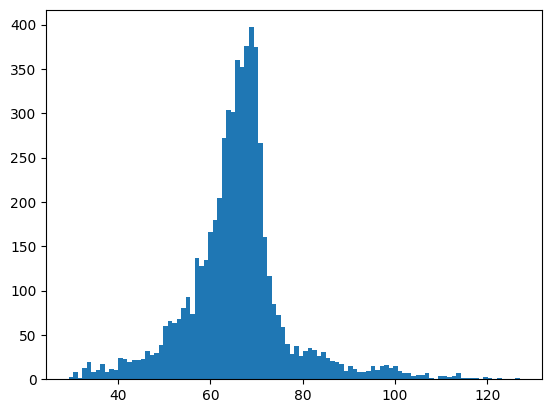

In [ ]:
# plot the histogram of evecs_1_5
import matplotlib.pyplot as plt

plt.hist(evecs_1_5.numpy(), bins=100)

plt.show()

# Same with WKS

In [5]:
import sys

sys.path.append('/home/s94zalek_hpc/shape_matching/pyFM_fork')
import pyFM

import pyFM.signatures.WKS_functions as WKS_functions
import pyFM.signatures.HKS_functions as HKS_functions

In [70]:
wks = 0

In [23]:
scene.geometry.clear()

# for i, idx in enumerate([1, 22, 33, 44, 55]):
for i, idx in enumerate([1, 2, 3, 4, 5]):
    data_0 = train_set[idx]['second']
    data_0 = dataset_shrec16[idx]['second']

    # evecs_1_5 = data_0['evecs'][:, 1:64].clone()
    # evecs_1_5 = evecs_1_5.abs()
    # evecs_1_5 = torch.sum(evecs_1_5, dim=1)
    
    wks = WKS_functions.auto_WKS(
        evals=data_0['evals'][0].clone(), evects=data_0['evecs'].clone(), num_E=100
        )
    # wks = torch.tensor(wks)
    wks = wks.abs()
    wks = torch.sum(wks, dim=1)
    
    # wks = wks[:, 10]
        
    cmap = trimesh.visual.color.interpolate(wks, 'bwr')

    mesh = trimesh.Trimesh(
        vertices=data_0['verts'].numpy() + np.array([i * 1, 0, 0]),
        faces=data_0['faces'].numpy()
        )

    mesh.visual.vertex_colors = cmap[:len(mesh.vertices)]
    scene.add_geometry(mesh)
    
    # del wks

scene.show()

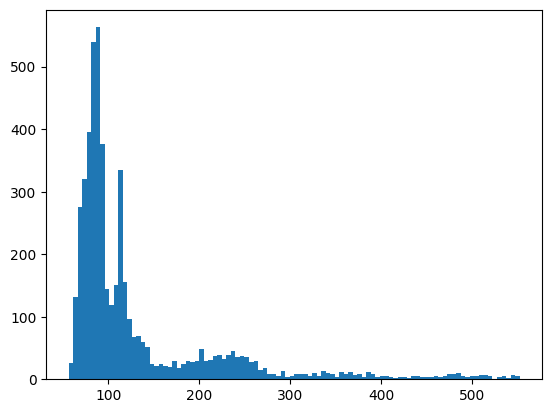

In [12]:
# plot the histogram of evecs_1_5
import matplotlib.pyplot as plt

plt.hist(wks.numpy(), bins=100)

plt.show()